In [14]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import matplotlib.pyplot as plt
import os

from collections import defaultdict

import os

from os import listdir
from os.path import isfile, join
import pandas as pd
from sklearn.model_selection import train_test_split
import gc; gc.enable() # memory is tight
import random

plt.rcParams['figure.figsize'] = (25, 14)

import tensorflow as tf
import tensorflow.keras as keras
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))
!nvidia-smi

2.9.3
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mon Jun  5 18:01:07 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 526.56       Driver Version: 526.56       CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   45C    P8    12W /  N/A |    239MiB /  6144MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
               

In [5]:
SEED = 5000

def set_seed(SEED):
    np.random.seed(SEED)
    random.seed(SEED)
    tf.random.set_seed(SEED)
    
    return SEED
    
set_seed(SEED)

BASE_DIR = "D:Dataset/dataset/kitti/"
LABEL_PATH = os.path.join(BASE_DIR,'data_object_label_2/training/label_2')

IMAGE_PATH = os.path.join(BASE_DIR,'data_object_image_2/training/image_2')
IMAGE_STEREO_PATH = os.path.join(BASE_DIR,'data_object_image_3/training/image_3')


IMAGE_WIDTH = 256
IMAGE_HEIGHT = 160

In [6]:
images =  [(f) for f in listdir(IMAGE_PATH) if isfile(join(IMAGE_PATH, f))]
masks = [(f) for f in listdir(LABEL_PATH) if isfile(join(LABEL_PATH, f))]
masks.sort()

df = pd.DataFrame(np.column_stack([masks]), columns=['masks'])
df['images'] = df['masks'].apply(lambda x: x[:-3]+'png')

no_images = df[df['images'].apply(lambda i:  i not in images)]
   
img = cv2.imread(os.path.join(IMAGE_PATH, '000015.png') )    
print('Image shape: ', img.shape)
print(df.shape)
df.head()

Image shape:  (374, 1238, 3)
(7481, 2)


,masks,images
0,000000.txt,000000.png
1,000001.txt,000001.png
2,000002.txt,000002.png
3,000003.txt,000003.png
4,000004.txt,000004.png


In [7]:
def get_labels(label_filename):
    """
        get_labels pozwala zwrocic. bounding boxy dla kazdego samochodu. Dzięki niemu możemy zobaczyć kontory samochodow,
        zwraca liste z wartooscciami bounding box.
        
        :param label_filename: filname like kitti_3d/{training,testing}/label_2/id.txt
        Returns Pandas DataFrame
        
        The label files contain the following information, which can be read and
        written using the matlab tools (readLabels.m, writeLabels.m) provided within
        this devkit. All values (numerical or strings) are separated via spaces,
        each row corresponds to one object. The 15 columns represent:
        #Values    Name      Description
        ----------------------------------------------------------------------------
           1    type         Describes the type of object: 'Car', 'Van', 'Truck',
                             'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram',
                             'Misc' or 'DontCare'
           1    truncated    Float from 0 (non-truncated) to 1 (truncated), where
                             truncated refers to the object leaving image boundaries
           1    occluded     Integer (0,1,2,3) indicating occlusion state:
                             0 = fully visible, 1 = partly occluded
                             2 = largely occluded, 3 = unknown
           1    alpha        Observation angle of object, ranging [-pi..pi]
           4    bbox         2D bounding box of object in the image (0-based index):
                             contains left, top, right, bottom pixel coordinates
           3    dimensions   3D object dimensions: height, width, length (in meters)
           3    location     3D object location x,y,z in camera coordinates (in meters)
           1    rotation_y   Rotation ry around Y-axis in camera coordinates [-pi..pi]
           1    score        Only for results: Float, indicating confidence in
                             detection, needed for p/r curves, higher is better.
    """
    data =  pd.read_csv(os.path.join(LABEL_PATH,label_filename), sep=" ", 
                       names=['label', 'truncated', 'occluded', 'alpha', 
                              'bbox_xmin', 'bbox_ymin', 'bbox_xmax', 
                              'bbox_ymax', 'dim_height', 'dim_width', 'dim_length', 
                              'loc_x', 'loc_y', 'loc_z', 'rotation_y', 'score'])
    
    return data
    
get_labels('000015.txt')

,label,truncated,occluded,alpha,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax,dim_height,dim_width,dim_length,loc_x,loc_y,loc_z,rotation_y,score
0,Car,0.89,0,2.29,0.00,194.70,414.71,373.00,1.57,1.67,4.14,-2.75,1.70,4.10,1.72,NaN
1,Pedestrian,0.00,1,0.71,1021.76,133.28,1101.39,316.63,1.81,1.06,0.73,4.75,1.33,7.59,1.25,NaN
2,Pedestrian,0.00,0,-1.58,672.23,171.73,690.13,224.33,1.73,0.84,0.86,2.46,1.41,24.14,-1.48,NaN
3,Pedestrian,0.00,0,-1.59,692.68,169.14,712.48,224.03,1.81,0.90,0.95,3.30,1.40,24.22,-1.46,NaN
4,Pedestrian,0.00,0,-1.46,537.84,168.08,560.90,224.34,1.78,0.92,1.01,-1.79,1.36,23.30,-1.54,NaN
5,DontCare,-1.00,-1,-10.00,916.14,175.59,973.32,253.55,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
6,DontCare,-1.00,-1,-10.00,628.80,173.19,653.95,196.66,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
7,DontCare,-1.00,-1,-10.00,610.47,175.76,625.72,205.87,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
8,DontCare,-1.00,-1,-10.00,766.54,168.32,841.38,261.86,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
9,DontCare,-1.00,-1,-10.00,464.22,177.67,508.93,230.69,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN


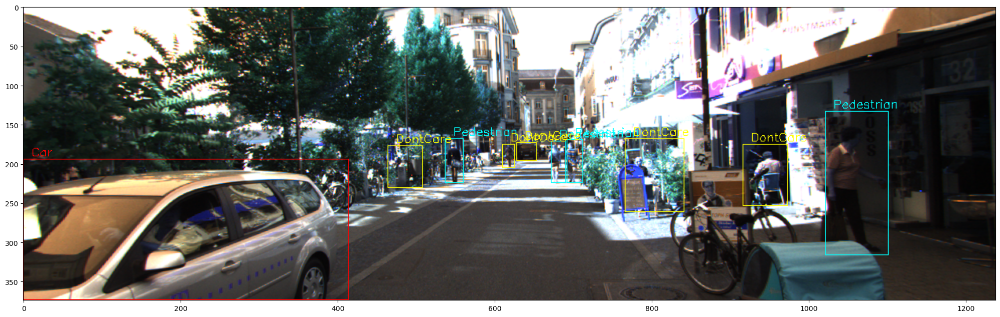

In [15]:
def open_image(image_filename):
    return cv2.imread(os.path.join(IMAGE_PATH, image_filename))
    
    
def draw_box2d_id(id):
    """
        pozwala zobazyc jakie BoundingBox sa dla naszego zestawu danych
    """
    return draw_box2d(open_image(id + '.png'),
                      get_labels(id + '.txt'))

LABEL_COLORS = {
    'Car': (255,0,0), 
    'Van': (255,255,0), 
    'Truck': (255,255,255),
    'Pedestrian': (0,255,255),
    'Person_sitting': (0,255,255), 
    
    'Cyclist': (0,128,255), 
    'Tram': (128,0,0),
    'Misc': (0,255,255),
    'DontCare': (255,255,0)
}

def draw_box2d(image, labels, ax = None):
    """
        pozwala rysowac boxy 2d dla naszego modelu.
        
        
        :param label_filename: filname like kitti_3d/{training,testing}/label_2/id.txt
        Returns Pandas DataFrame
    """
    img = image.copy()
    for index, row in labels.iterrows():
        left_corner = (int(row.bbox_xmin), int(row.bbox_ymin))
        right_corner = (int(row.bbox_xmax), int(row.bbox_ymax))
        label_color = LABEL_COLORS.get(row.label,(0,255,0))
        
        img = cv2.rectangle(img, 
                            left_corner, right_corner, label_color, 1)
        img = cv2.putText(img, str(row.label), 
                          (left_corner[0] + 10, left_corner[1] - 4) , 
                          cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                          label_color, 1)
    if ax == None:
        plt.imshow(img)
    else:
        ax.imshow(img)

draw_box2d_id('000015')

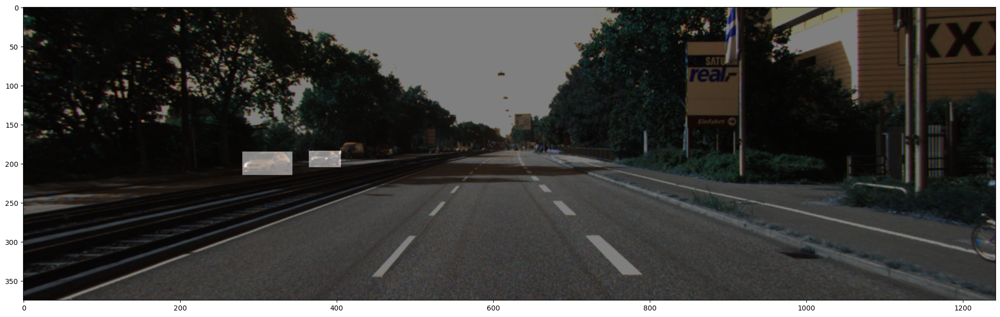

In [16]:
DTYPE = np.float64

def get_image(path):
    return cv2.imread(path)

def create_mask(mask_dir, img_shape):
    """
        pozwala wygenerowac maske, Poniewaz w przypadku modelu UNET na wyjsciu chcemy miec zwykla maske obiektu,
        gdzie w pelni zaznaczymy gdzie są obiekty.
        
        Uwzględniliśmy w nich samochód, van, track, oraz osoby.
    """
    mask = np.zeros(shape=(img_shape[0], img_shape[1], 1), dtype = DTYPE)
    

    with open(mask_dir) as f:
        content = f.readlines()
    content = [x.split() for x in content] 
    for item in content:
        if item[0]=='Car' or item[0]=='Truck' or item[0]=='Van' or item[0]=='Pedestrian':
            ul_col, ul_row = int(float(item[4])), int(float(item[5]))
            lr_col, lr_row = int(float(item[6])), int(float(item[7]))
            
            mask[ul_row:lr_row, ul_col:lr_col, 0] = 1 
    return mask


def draw_mask(image, mask, ax = None):
    rgb_mask = np.repeat(mask, 3, axis = 2)
    img = cv2.addWeighted( image, 0.5, rgb_mask, 0.5, 0)
    if ax == None:
        plt.imshow(img)
    else:
        ax.imshow(img)
        
def draw_mask_id(id):
    # ponieważ maska to wartości 0,1 a obraz to wartości 0-255, to obraz trzeba podzielić przez 255.0
    img = np.array(get_image(os.path.join(IMAGE_PATH,id + '.png')) / 255.0, dtype = DTYPE) 
    mask = create_mask(os.path.join(LABEL_PATH,  id + '.txt'), img.shape )
    draw_mask(img,mask)
    plt.show()
    
    
draw_mask_id('000004')

In [10]:
from abc import ABCMeta, abstractmethod
import imgaug.augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage



class DataGenerator(tf.keras.utils.Sequence):

    def __init__(self,indices, batch_size, shuffle):
        self.indices = indices
        self.batch_size = batch_size
        self.shuffle = shuffle
        
        self.on_epoch_end()
        
    def __len__(self):
        return len(self.indices) // self.batch_size

    def __getitem__(self, index):
        index = self.index[index * self.batch_size:(index + 1) * self.batch_size]
        batch = [self.indices[k] for k in index]
        
        return self.get_data(batch)
    
    def sample(self):
        return self[random.randint(0,len(self))]

    def on_epoch_end(self):
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    @abstractmethod
    def get_data(self, batch):
        raise NotImplementedError

In [17]:
class KittiDataGenerator(DataGenerator):
    """
        Bounding Box dla obiektow.
    """
    def __init__(self, 
                 df,
                 shape = (IMAGE_WIDTH, IMAGE_HEIGHT),
                 
                 batch_size=32, 
                 shuffle=True, 
                 
                 augmentation = None,
                 
                 image_col = 'images',
                 mask_col = 'masks',
                 
                 label_path = LABEL_PATH,
                 image_path = IMAGE_PATH
                ):
        
        self.df = df
        self.shape = shape

        self.image_col = image_col
        self.mask_col = mask_col
        self.label_path = label_path
        self.image_path = image_path
        self.augmentation = augmentation
        
        super().__init__(self.df.index.tolist(), batch_size, shuffle)
    
    def get_x(self, index):
        return get_image(
            os.path.join(self.image_path, self.df.loc[index][self.image_col])
        ) 
    
    def get_y(self, index, shape):
        return create_mask(os.path.join(self.label_path, self.df.loc[index][self.mask_col]),shape) 


    def get_data(self, batch):
        batch_X = []
        batch_y = []
        
        for i in batch:
            image_r = self.get_x(i)
            mask_r = self.get_y(i, image_r.shape)
            
            # w przypadku cv2.resize, odwracamy wielkosc, najpierw jest wysokosc, potem szerokosc
            image_r = cv2.resize(image_r, (self.shape[0], self.shape[1]))
            # mask_r po przekształceniu nie będzie posiadac wartości 0,1 a wartości między 0 a 1
            mask_r = cv2.resize(mask_r,(self.shape[0], self.shape[1]))
            
            if self.augmentation is not None:
                mask_r = np.array(mask_r, dtype=np.int32)
                segmap = SegmentationMapsOnImage(mask_r, shape=image_r.shape)
                image_r, segmap = self.augmentation(image = image_r, segmentation_maps = segmap)
                mask_r = segmap.get_arr().astype(np.float64)
                
                
            batch_X.append(image_r)
            batch_y.append(mask_r)
        
        batch_X = np.array(batch_X)
        batch_y = np.array(batch_y)
        

#         if self.augmentation is not None:
#             print(batch_y.shape)
#             batch_y = np.expand_dims(batch_y, axis=3)
#             print(batch_y.shape)
            
#             batch_X, segmap = 
            
#             batch_y = segmap
#             print(batch_y.shape)
#             batch_y = segmap.draw()

        return batch_X  / 255.0, batch_y
    
# Define our augmentation pipeline.
# seq = iaa.Sequential([
#     iaa.Dropout([0.05, 0.2]),      # drop 5% or 20% of all pixels
#     iaa.Sharpen((0.0, 1.0)),       # sharpen the image
#     iaa.Affine(rotate=(-45, 45)),  # rotate by -45 to 45 degrees (affects segmaps)
#     iaa.ElasticTransformation(alpha=50, sigma=5)  # apply water effect (affects segmaps)
# ], random_order=True)

seq = iaa.Sequential([
    iaa.Dropout([0.00, 0.06]),      # drop 5% or 20% of all pixels
    iaa.Sharpen((0.0, 0.1)),       # sharpen the image
    iaa.Multiply((0.5, 1.5), per_channel=0.5), # brightness
    iaa.Affine(rotate=(-10, 10)),  # rotate by -45 to 45 degrees (affects segmaps)
    iaa.GammaContrast((0.5, 2.0))  
])
    
image_generator = KittiDataGenerator(df, 
                                     shape = (IMAGE_WIDTH, IMAGE_HEIGHT),
                                     augmentation = seq)
batch_X,batch_y = image_generator.sample()
print('Input : ', batch_X.shape, batch_X.dtype,' max: ', batch_X.max(),  
      '\nOutput: ', batch_y.shape, batch_y.dtype, ' max: ', batch_y.max())

Input :  (32, 160, 256, 3) float64  max:  1.0 
Output:  (32, 160, 256) float64  max:  1.0


In [18]:
def calc_IOU(y_true, y_pred, smooth=1):
    y_true_f = keras.layers.Flatten()(y_true)
    y_pred_f = keras.layers.Flatten()(y_pred)
    
    intersection = keras.backend.sum(y_true_f*y_pred_f)
    
    return (2*(intersection + smooth) / (keras.backend.sum(y_true_f) + keras.backend.sum(y_pred_f) + smooth))


def calc_IOU_loss(y_true, y_pred):
    return -calc_IOU(y_true, y_pred)

calc_IOU_loss(batch_y,batch_y) #

<tf.Tensor: shape=(), dtype=float32, numpy=-1.0000032>

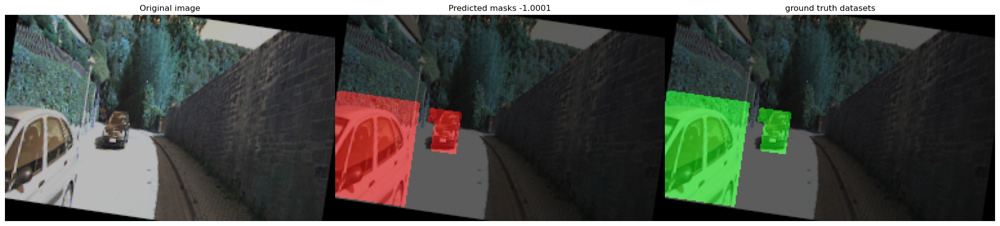

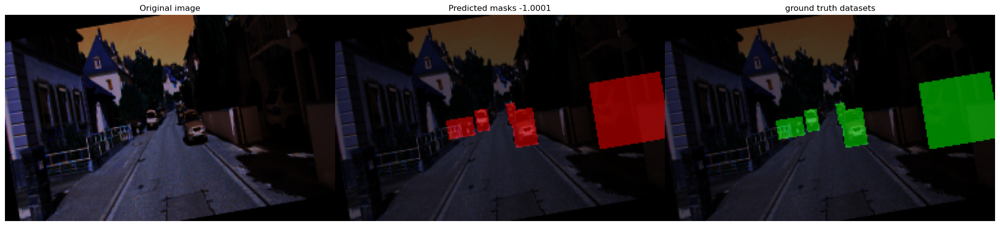

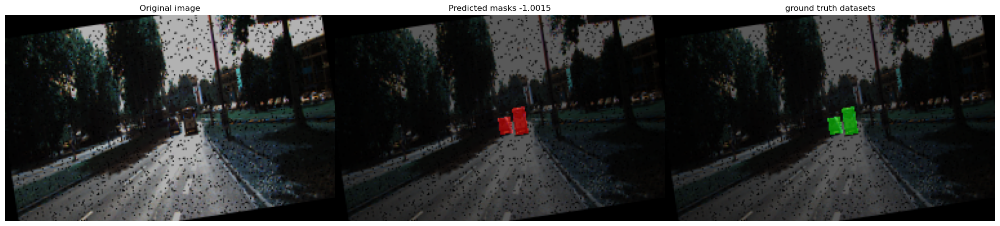

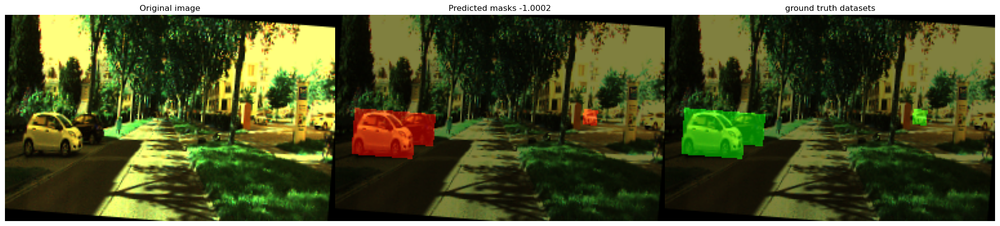

In [19]:
def show_data(X,y, y_pred = None):
    if y_pred is None:
        y_pred = y
        
    for x_i,y_i,y_pred_i in zip(X,y,y_pred):
        im = np.array(255*x_i,dtype=np.uint8)
        im_mask = np.array(255*y_i,dtype=np.uint8)
        im_pred = np.array(255*y_pred_i,dtype=np.uint8)
        im_pred1 = np.array(255*y_pred_i,dtype=np.uint8)

        rgb_mask_pred = cv2.cvtColor(im_pred,cv2.COLOR_GRAY2RGB)
        rgb_mask_pred1 = cv2.cvtColor(im_pred,cv2.COLOR_GRAY2RGB)
        temp1 = rgb_mask_pred[:,:,1:3]
        temp2 = rgb_mask_pred[:,:,1:2]
        rgb_mask_pred[:,:,1:3] = 0*rgb_mask_pred[:,:,1:3]
        rgb_mask_true= cv2.cvtColor(im_mask,cv2.COLOR_GRAY2RGB)
        rgb_mask_true[:,:,0] = 0*rgb_mask_true[:,:,0]
        rgb_mask_true[:,:,2] = 0*rgb_mask_true[:,:,2]
        
#         print(im.shape, rgb_mask_pred.shape)

        img_pred = cv2.addWeighted(rgb_mask_pred,0.5,im,0.5,0)
        img_true = cv2.addWeighted(rgb_mask_true,0.5,im,0.5,0)
        
        loss = calc_IOU_loss(np.array([y_i]),np.array([y_pred_i]))
    
        plt.figure(figsize=(20,8))
        plt.subplot(1,3,1)
        plt.imshow(im)
        plt.title('Original image')
        plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow(img_pred)
        plt.title(f'Predicted masks {loss:0.4f}')
        plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(img_true)
        plt.title('ground truth datasets')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

show_data(batch_X[:4], batch_y[:4])

In [22]:
df_train, df_val = train_test_split(df, test_size=0.25, shuffle=True)
display(df_train.head())
display(df_val.head())

,masks,images
5028,005028.txt,005028.png
2363,002363.txt,002363.png
3381,003381.txt,003381.png
679,000679.txt,000679.png
4982,004982.txt,004982.png


,masks,images
5677,005677.txt,005677.png
5256,005256.txt,005256.png
4512,004512.txt,004512.png
2323,002323.txt,002323.png
500,000500.txt,000500.png


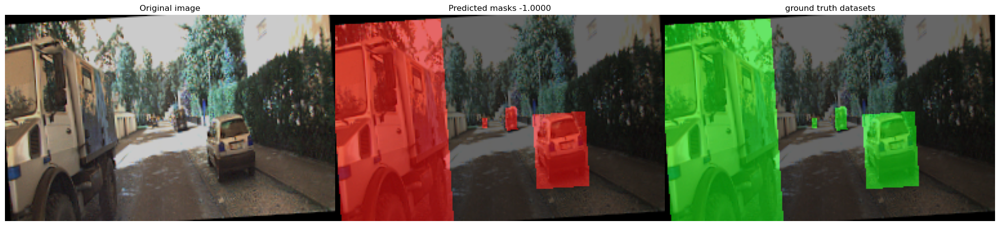

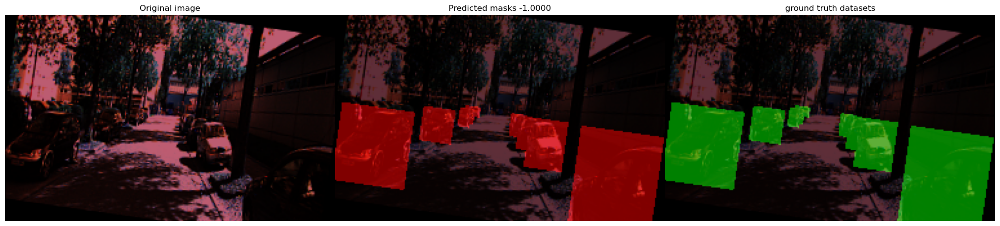

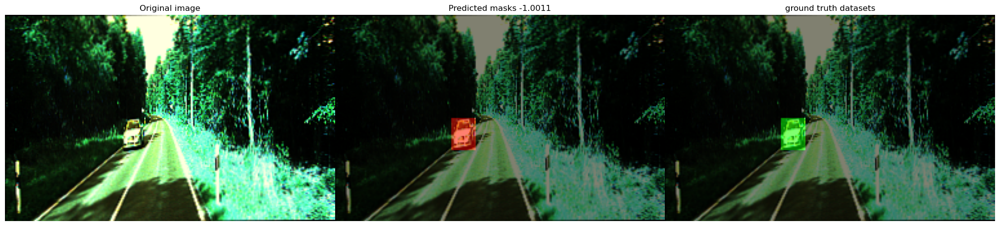

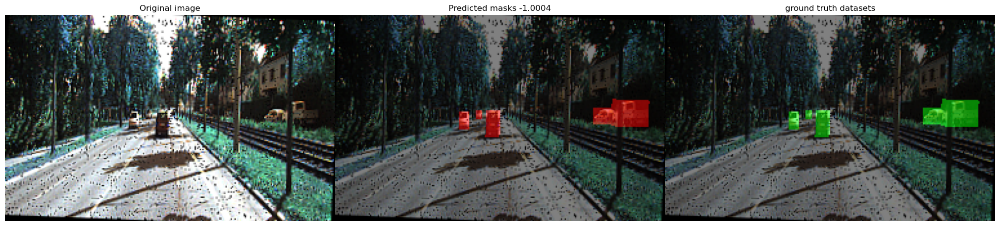

In [23]:
kitti_train = KittiDataGenerator(df_train,
                                 shape = (IMAGE_WIDTH, IMAGE_HEIGHT), augmentation = seq)

kitti_val =  KittiDataGenerator(df_val,
                                 shape = (IMAGE_WIDTH, IMAGE_HEIGHT))

batch_X, batch_y = kitti_train.sample()
show_data(batch_X[:4], batch_y[:4])

In [24]:
class FeaturePyramid(tf.keras.layers.Layer):

    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid")
        self.backbone = backbone
        self.conv_c3_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = tf.keras.layers.UpSampling2D(2)

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output

print('슝=3')

슝=3


In [25]:
def build_head(output_filters, bias_init):
    head = tf.keras.Sequential([tf.keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            tf.keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(tf.keras.layers.ReLU())
    head.add(
        tf.keras.layers.Conv2D(
            output_filters,
            3,
            1,
            padding="same",
            kernel_initializer=kernel_init,
            bias_initializer=bias_init,
        )
    )
    return head

print('슝=3')

슝=3


In [26]:
def get_backbone():
    backbone = tf.keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return tf.keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )

In [27]:
class RetinaNet(tf.keras.Model):

    def __init__(self, num_classes, backbone):
        super(RetinaNet, self).__init__(name="RetinaNet")
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)

In [28]:
class RetinaNetBoxLoss(tf.losses.Loss):

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetLoss(tf.losses.Loss):

    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss

In [30]:
num_classes = 8
batch_size = 2

resnet50_backbone = get_backbone()
loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes, resnet50_backbone)

In [31]:
learning_rates = [2.5e-06, 0.000625, 0.00125, 0.0025, 0.00025, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates
)
optimizer = tf.optimizers.SGD(learning_rate=learning_rate_fn, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer)

In [33]:
from livelossplot import PlotLossesKeras
print(PlotLossesKeras)

<function PlotLossesKeras at 0x000001E514A82DC0>


In [35]:
loss_history =  model.fit(
        kitti_train,
        epochs=20,
        validation_data=kitti_val,
        callbacks=[ PlotLossesKeras()]
    )

Epoch 1/20


InvalidArgumentError: Graph execution error:

Detected at node 'RetinaNetLoss/RetinaNetBoxLoss/sub' defined at (most recent call last):
    File "C:\tools\miniconda3\envs\tf\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "C:\tools\miniconda3\envs\tf\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
      app.start()
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelapp.py", line 725, in start
      self.io_loop.start()
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "C:\tools\miniconda3\envs\tf\lib\asyncio\base_events.py", line 596, in run_forever
      self._run_once()
    File "C:\tools\miniconda3\envs\tf\lib\asyncio\base_events.py", line 1890, in _run_once
      handle._run()
    File "C:\tools\miniconda3\envs\tf\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 409, in dispatch_shell
      await result
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\ipykernel\zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3006, in run_cell
      result = self._run_cell(
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3061, in _run_cell
      result = runner(coro)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3266, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3445, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\rh987\AppData\Local\Temp\ipykernel_6868\1303406523.py", line 1, in <module>
      loss_history =  model.fit(
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
      return fn(*args, **kwargs)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\training.py", line 1409, in fit
      tmp_logs = self.train_function(iterator)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\training.py", line 1051, in train_function
      return step_function(self, iterator)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\training.py", line 1040, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\training.py", line 1030, in run_step
      outputs = model.train_step(data)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\training.py", line 890, in train_step
      loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\training.py", line 948, in compute_loss
      return self.compiled_loss(
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\engine\compile_utils.py", line 201, in __call__
      loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\losses.py", line 139, in __call__
      losses = call_fn(y_true, y_pred)
    File "C:\Users\rh987\AppData\Local\Temp\ipykernel_6868\938886119.py", line 62, in call
      box_loss = self._box_loss(box_labels, box_predictions)
    File "C:\tools\miniconda3\envs\tf\lib\site-packages\keras\losses.py", line 139, in __call__
      losses = call_fn(y_true, y_pred)
    File "C:\Users\rh987\AppData\Local\Temp\ipykernel_6868\938886119.py", line 10, in call
      difference = y_true - y_pred
Node: 'RetinaNetLoss/RetinaNetBoxLoss/sub'
required broadcastable shapes
	 [[{{node RetinaNetLoss/RetinaNetBoxLoss/sub}}]] [Op:__inference_train_function_20358]

In [ ]:
# 데이터 샘플 확인
sample = ds_train.take(1)

for example in sample:  
    print('------Example------')
    print(list(example.keys()))
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Image.fromarray(image.numpy())
plt.imshow(img)
plt.show()

In [ ]:
# 이미지에 BoundingBox 표시하기
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)

    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height

    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    for _rect in rects:
        draw.rectangle(_rect, outline=(255,0,0), width=2)
    return input_image
    

visualize_bbox(img, objects['bbox'].numpy())

In [ ]:
def swap_xy(boxes):
    """
    # y1x1y2x2->x1y1x2y2
    """
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)

In [ ]:
def random_flip_horizontal(image, boxes):
    """
    좌우반전 함수
    균일분포 랜덤 0.5 이상 (50%)
    image 좌우반전
    label x1, x2 값 (1-x) 취함
    """
    
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack(
           [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )
        
    return image, boxes

In [ ]:
def resize_and_pad_image(image, training=True):
    """
    학습
    """
    
    min_side = 800.0
    max_side = 1333.0
    min_side_range = [640, 1024]
    stride = 128.0
    
    # image shape : tensor데이터
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    
    # Training일때 minside를 range에서 뽑음
    if training:
        min_side = tf.random.uniform((), min_side_range[0], min_side_range[1], dtype=tf.float32)
    
    # 실제 이미지와 비교하여 축소 ratio 얻음
    ratio = min_side / tf.reduce_min(image_shape)
    
    # 큰변 값을 비교하여 ratio 수정
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
        
    # image shape 갱신
    image_shape = ratio * image_shape
    # resize
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    
    # 이미지의 shape를 stride의 배수에 맞춤
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    
    # 이미지에 패딩추가
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio

In [ ]:
def convert_to_xywh(boxes):
    """
    x1x2y1y2 -> xywh
    """
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )

In [ ]:
def preprocess_data(sample):
    """
    전처리 함수
    1. image, bbox, (class_id : [Tensor]) 값 받음
    2. 좌우반전 적용
    3. 이미지 resize, padding 적용, 이미지의 shape를 bbox에 적용
    4. Bbox(xxyy -> xywh)
    """
    image = sample["image"]
    bbox = swap_xy(sample["objects"]["bbox"])
    class_id = tf.cast(sample["objects"]["type"], dtype=tf.int32)

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id

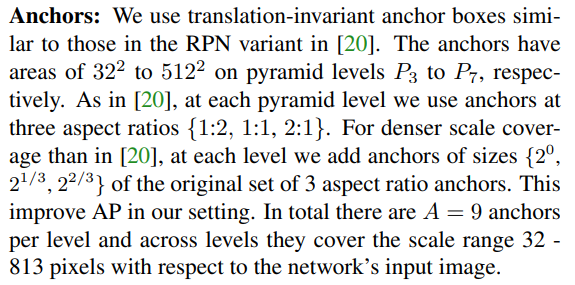

In [ ]:
# 물체가 있을곳에 후보군을 두는 AnchorBox class를 만듦니다
# 이때 RetinaNet에서는 Anchorbox는 FPN의 각 층에서 사용하기 때문에 더 많은 AnchorBox가 필요합니다.
# 이때 각 level 별 AnchorBox의 개수는 정해져있습니다.
 


class AnchorBox:
    def __init__(self):
        # 종횡비
        self.aspect_ratios = [0.5, 1.0, 2.0]
        # 크기비
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]
        
        # 한개의 Grid당 anchor 개수
        self._num_anchors = len(self.aspect_ratios) * len(self.scales)    
        # layer의 level별 Grid간의 거리
        self._strides = [2 ** i for i in range(3, 8)]
        # 한개의 anchor의 넓이
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        # 한개의 anchor의 넓이별 anchor의 dims(1,9,2)
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        """
        Anchor의 위치를 제외하고 크기별(3), 종횡비별(3), 그리드 간격별(5)로 생성
        """
        anchor_dims_all = []
        
        # By 레이어
        for area in self._areas:
            anchor_dims = []
            
            # By 종횡비
            for ratio in self.aspect_ratios:
                # Anchor size
                anchor_height = tf.math.sqrt(area / ratio) 
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2] # (1,2)를 (1,1,2)
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2)) # (1,1,2) 3개를 쌓아서 (1,3,2), 그걸 종횡비 별 3번 반복 (1,9,2)
            
            # layer에서 크기별 (1,9,2) 즉 (가로,세로) 세트가 9개 -> 15개
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        
        # 모든 bbox의 중심점 잡기
        # range(0~width) + 0.5 # shape : [feature_width,]
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        # range(0~height) + 0.5 # shape : [feature_height,]
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        
        # tf.meshgrid(rx, ry) # shape [0] : [feature_height,feature_width], [1] : [feature_height:feature_width] 리스트에 2개의 요소
        # bbox center의 가로 위치, 세로위치 shape : (feature_height, feature_width, 2)
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        # shape=(feature_height, feature_width, 2, 1) [[가로 중심위치],[세로 중심위치]] 형태로 변환
        centers = tf.expand_dims(centers, axis=-2)
        # 한개의 grid에는 위의 bbox중심위치가 9개씩 필요함 (num_anchors 개수만큼)
        # shape(feature_height,feature_width, 2*9(num_anchors), 1)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        
        # 위치를 고려하지 않았던 anchor_dims를 height, width 만큼 tile (h,w) 생성
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        # 모든 anchor 박스의 (y_c, x_c, h, w) 좌표 생성 
        anchors = tf.concat([centers, dims], axis=-1)
        # 2차 tensor로 reshape
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        # 이미지의 사이즈별 anchors 얻기
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)

In [ ]:
def convert_to_corners(boxes):
    """
    xywh->xyxy
    """
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

def compute_iou(boxes1, boxes2):
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2]) # xmin, ymin
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:]) # xmax, ymax
    intersection = tf.maximum(0.0, rd - lu) # 음수는 되지 않도록 width, height
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1] # width * height
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

In [ ]:
class LabelEncoder:

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        """
        iou 0.5 이상은 물체, 0.4 이하는 배경
        """
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1) # 일반 max 랑 같음
        matched_gt_idx = tf.argmax(iou_matrix, axis=1) # max의 위치
        positive_mask = tf.greater_equal(max_iou, match_iou) # 같거나 큰지 여부(True, False]) 반환
        negative_mask = tf.less(max_iou, ignore_iou) # 더 작은지 여부 (True, False) 반환
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        return batch_images, labels.stack()
    